# Importing Libraries ad Modules

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
plt.ion()

from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
cudnn.benchmark = True

torch.manual_seed(612)

import torchvision
from torchvision import datasets, models, transforms
from torchvision.utils import make_grid, save_image
from torchvision.io import read_image
import torchvision.transforms as tt
import torchvision.transforms.functional as ttf

import time
import glob
import os
from pathlib import Path
import copy

# Showing one image from each class

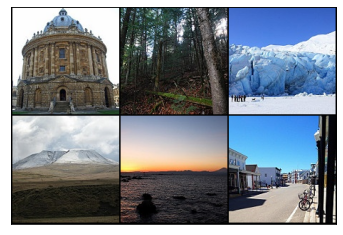

In [ ]:
def show(orig_imgs):
    if not isinstance(orig_imgs, list):
        orig_imgs = [orig_imgs]
    fig, axs = plt.subplots(ncols=len(orig_imgs), squeeze=False)
    for i, orig_img in enumerate(orig_imgs):
        orig_img = orig_img.detach()
        orig_img = ttf.to_pil_image(orig_img)
        axs[0, i].imshow(np.asarray(orig_img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

labels = ["buildings", "forest", "glacier", "mountain", "sea", "street"]
base_path = "/content/drive/MyDrive/Data sets/intel_image/seg_train/seg_train/"

image_list = []

for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = read_image(files[index])
    image_list.append(orig_img)

grid = make_grid(image_list, nrow = 3)
show(grid)

# Image transformations with Pytorch

## Function to visualize image transformations

In [ ]:
def plot(imgs, with_orig=True, row_title=None, **imshow_kwargs):

    if not isinstance(imgs[0], list):
        # Make a 2d grid even if there's just 1 row
        imgs = [imgs]

    num_rows = len(imgs)
    num_cols = len(imgs[0]) + with_orig
    fig, axs = plt.subplots(nrows = num_rows, ncols = num_cols, squeeze = False)
    for row_idx, row in enumerate(imgs):
        row = [orig_img] + row if with_orig else row
        for col_idx, img in enumerate(row):
            ax = axs[row_idx, col_idx]
            ax.imshow(np.asarray(img), **imshow_kwargs)
            ax.set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

    if with_orig:
        axs[0, 0].set(title = "Original image")
        axs[0, 0].title.set_size(8)
    if row_title is not None:
        for row_idx in range(num_rows):
            axs[row_idx, 0].set(ylabel=row_title[row_idx])

    plt.tight_layout()

## Padding

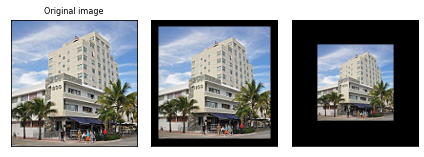

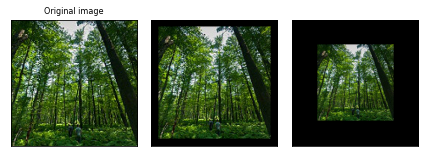

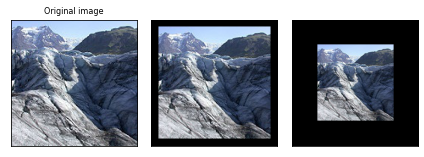

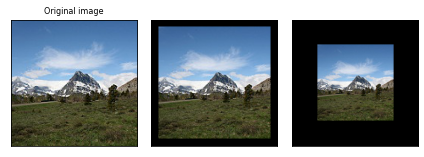

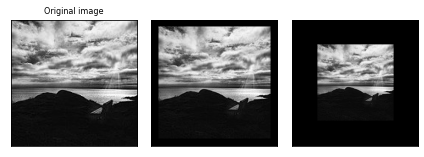

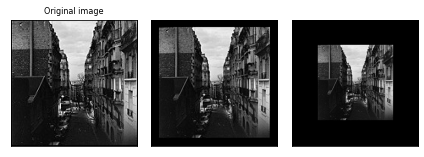

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    padded_imgs = [tt.Pad(padding = padding)(orig_img) for padding in (10, 50)]
    plot(padded_imgs)

## Resize

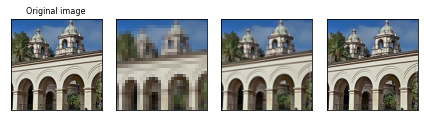

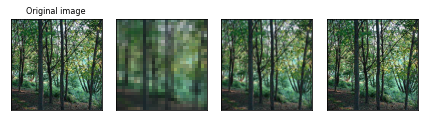

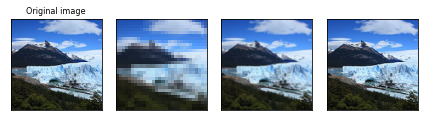

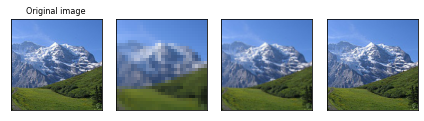

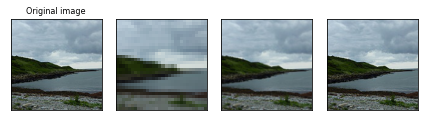

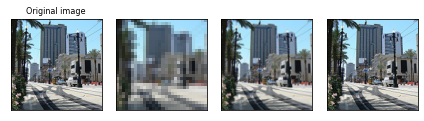

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    resized_imgs = [tt.Resize(size=size)(orig_img) for size in (30, 100, orig_img.size)]
    plot(resized_imgs)

## Center Crop

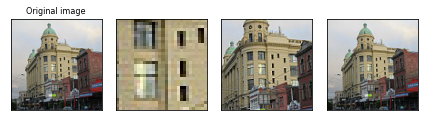

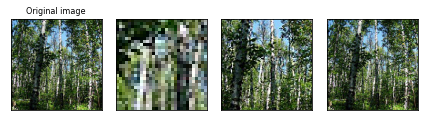

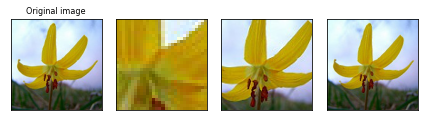

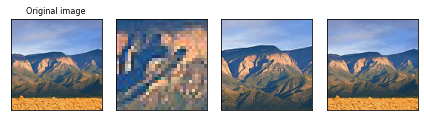

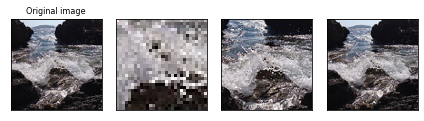

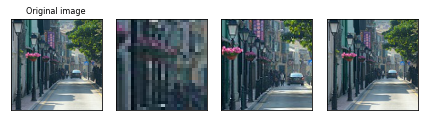

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    center_crops = [tt.CenterCrop(size=size)(orig_img) for size in (30, 100, orig_img.size)]
    plot(center_crops)

## Five Crop

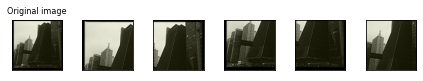

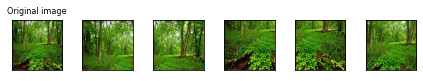

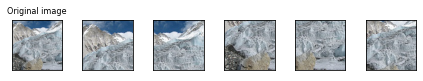

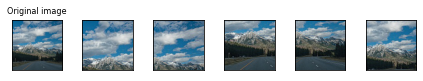

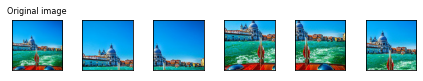

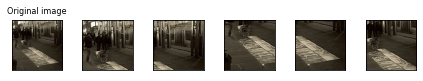

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    (top_left, top_right, bottom_left, bottom_right, center) = tt.FiveCrop(size=(100, 100))(orig_img)
    plot([top_left, top_right, bottom_left, bottom_right, center])

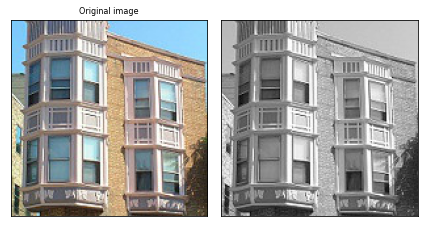

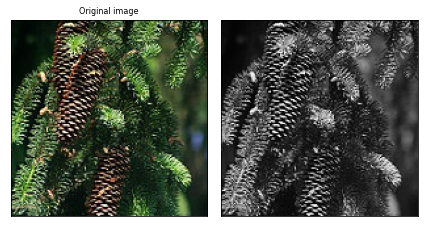

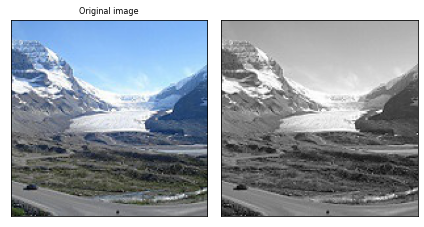

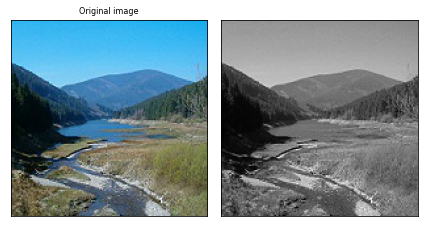

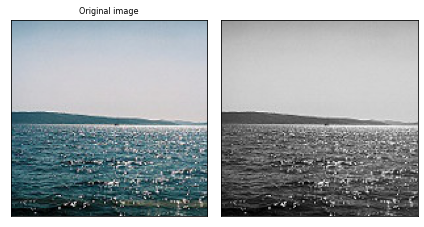

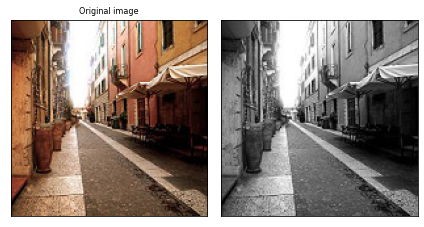

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    gray_img = tt.Grayscale()(orig_img)
    plot([gray_img], cmap='gray')

## Color Jitter

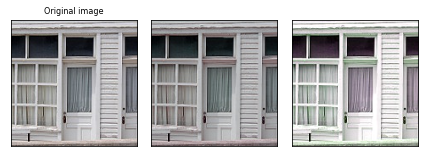

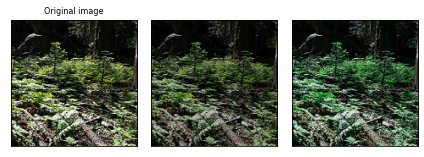

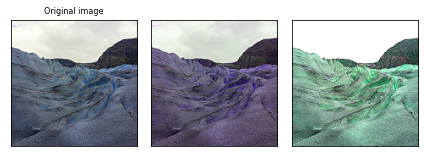

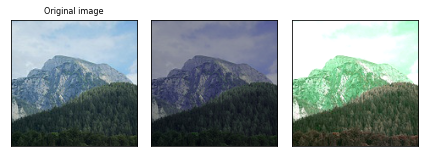

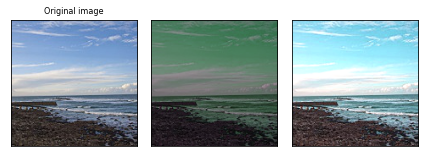

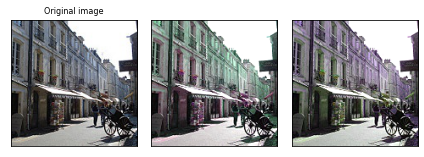

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    jitter = tt.ColorJitter(brightness=.5, hue=.3)
    jitted_imgs = [jitter(orig_img) for _ in range(2)]
    plot(jitted_imgs)

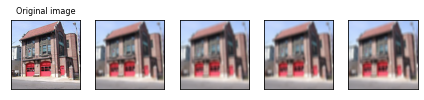

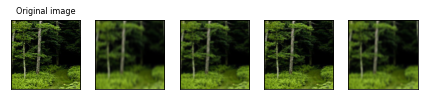

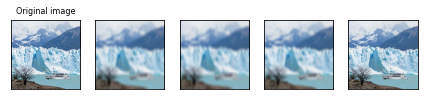

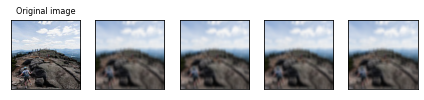

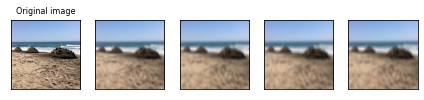

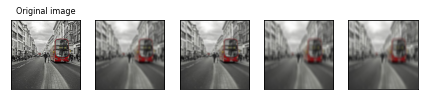

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    blurrer = tt.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5))
    blurred_imgs = [blurrer(orig_img) for _ in range(4)]
    plot(blurred_imgs)

## Random Perspective

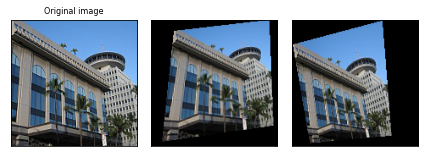

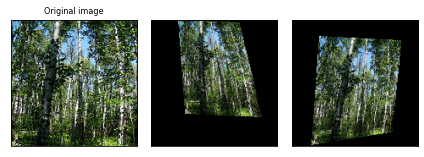

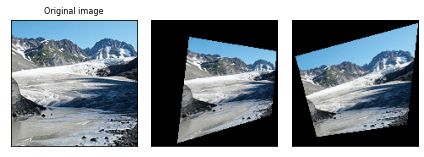

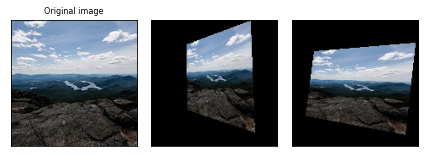

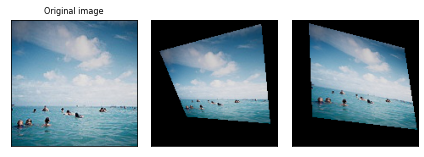

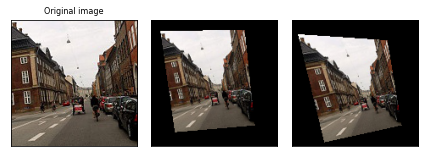

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    perspective_transformer = tt.RandomPerspective(distortion_scale=0.6, p=1.0)
    perspective_imgs = [perspective_transformer(orig_img) for _ in range(2)]
    plot(perspective_imgs)

## Random Rotation

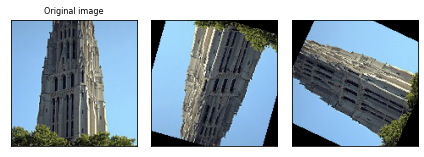

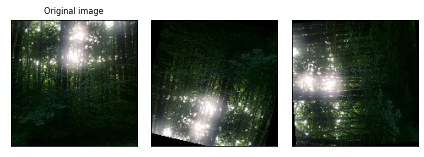

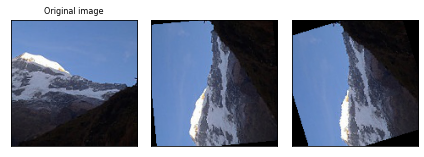

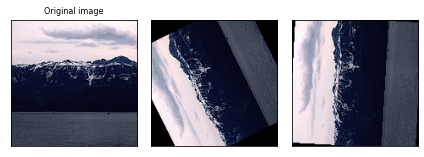

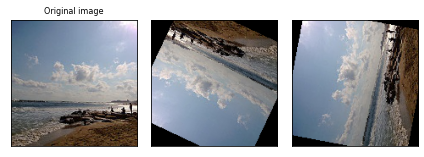

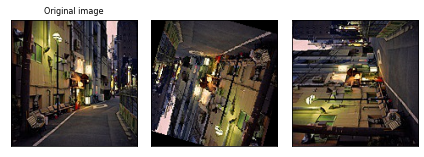

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    rotater = tt.RandomRotation(degrees=(0, 180))
    rotated_imgs = [rotater(orig_img) for _ in range(2)]
    plot(rotated_imgs)

## Random Affine

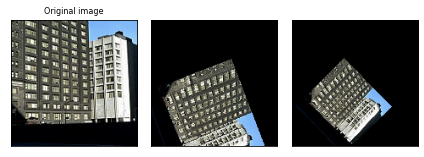

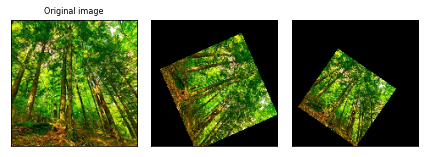

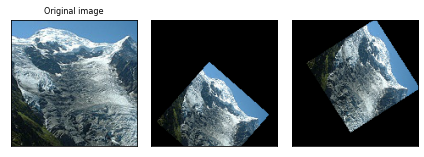

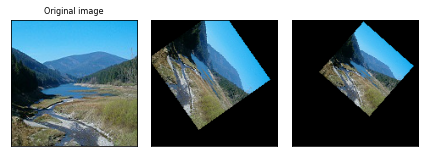

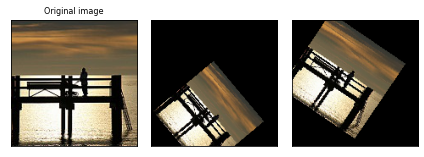

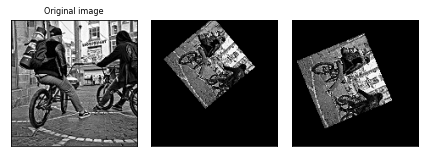

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    affine_transfomer = tt.RandomAffine(degrees=(30, 70), translate=(0.1, 0.3), scale=(0.5, 0.75))
    affine_imgs = [affine_transfomer(orig_img) for _ in range(2)]
    plot(affine_imgs)

## Random Crop

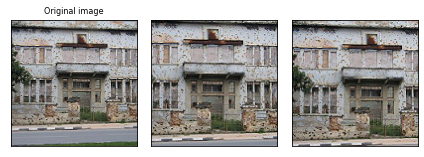

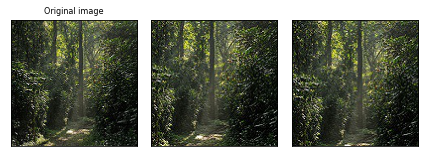

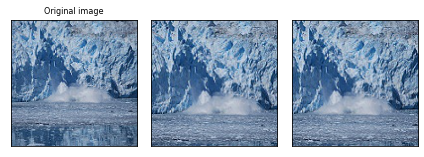

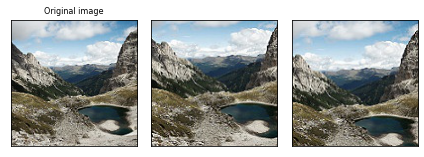

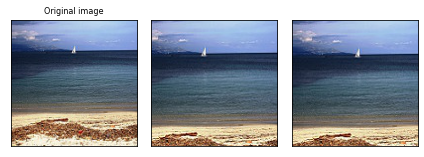

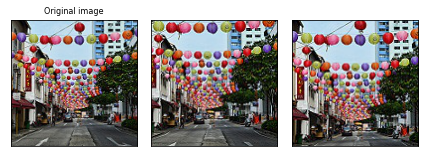

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    cropper = tt.RandomCrop(size=(128, 128))
    crops = [cropper(orig_img) for _ in range(2)]
    plot(crops)

## Random Resized Crop

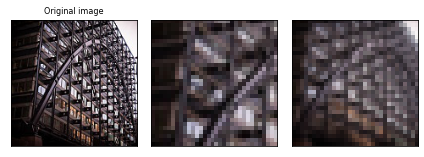

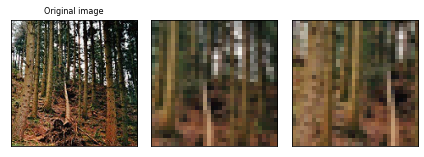

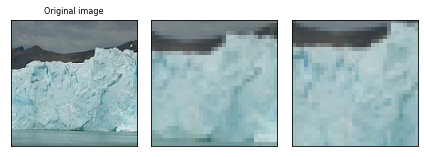

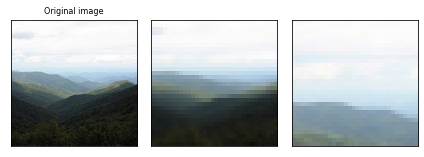

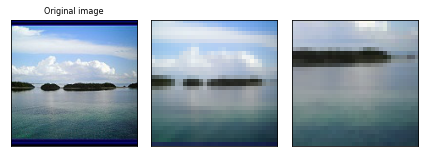

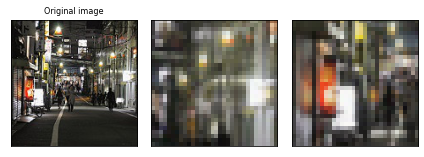

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    resize_cropper = tt.RandomResizedCrop(size=(32, 32))
    resized_crops = [resize_cropper(orig_img) for _ in range(2)]
    plot(resized_crops)

## Random Invert

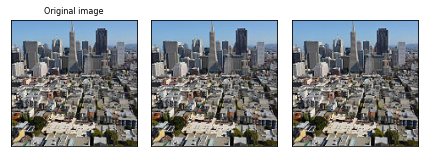

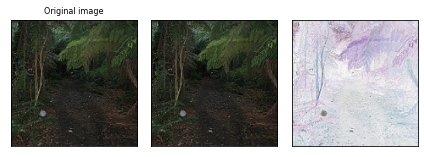

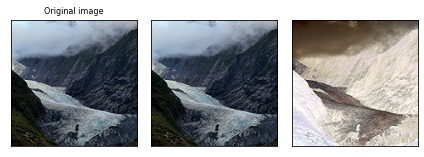

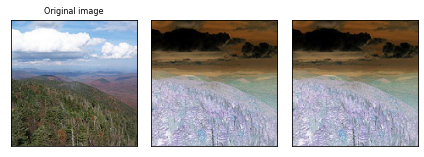

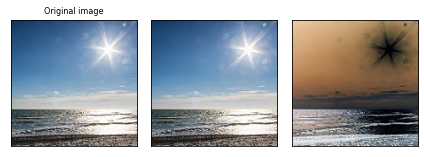

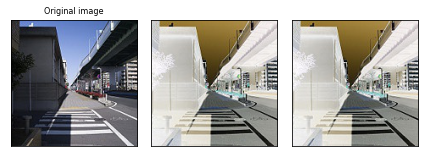

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    inverter = tt.RandomInvert()
    invertered_imgs = [inverter(orig_img) for _ in range(2)]
    plot(invertered_imgs)

## Random Posterize

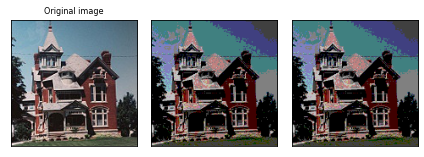

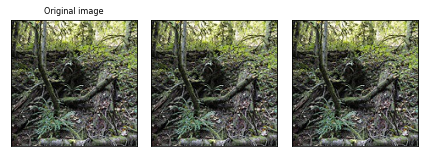

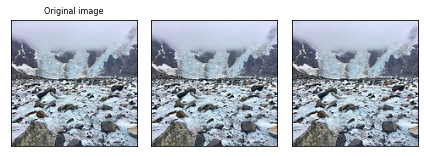

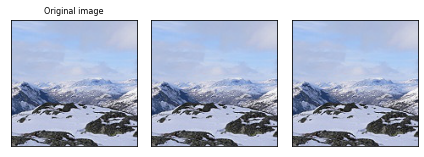

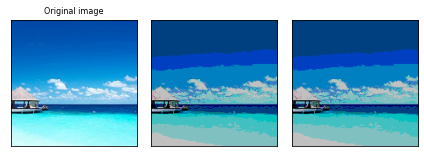

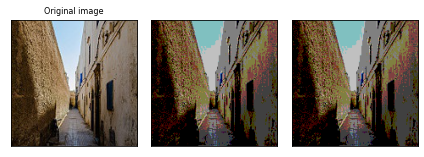

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    posterizer = tt.RandomPosterize(bits=2)
    posterized_imgs = [posterizer(orig_img) for _ in range(2)]
    plot(posterized_imgs)

## Random Solarize

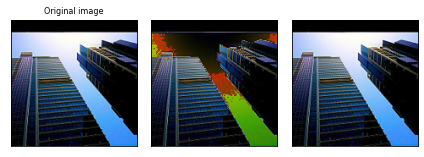

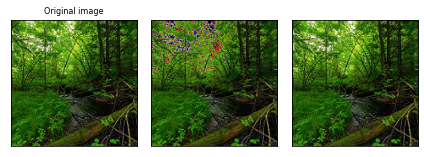

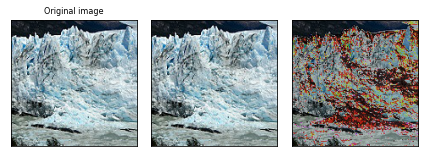

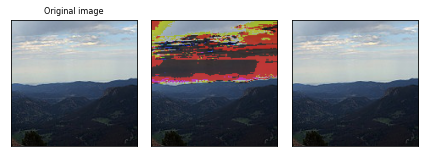

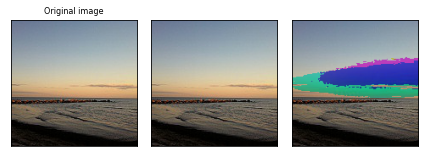

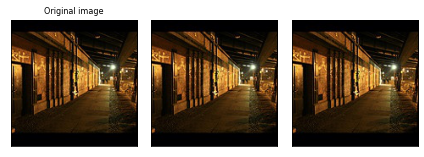

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    solarizer = tt.RandomSolarize(threshold=192.0)
    solarized_imgs = [solarizer(orig_img) for _ in range(2)]
    plot(solarized_imgs)

## Random Adjust Sharpness

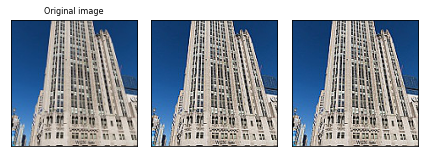

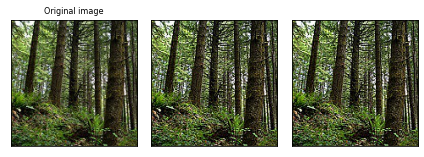

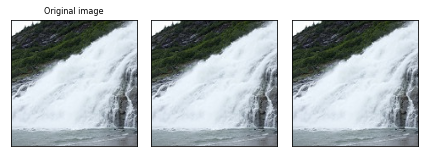

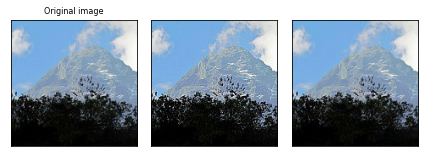

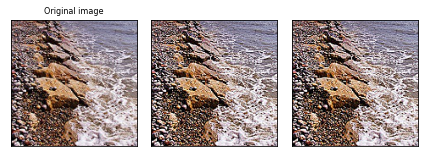

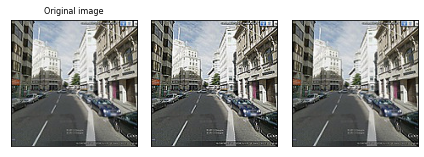

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    sharpness_adjuster = tt.RandomAdjustSharpness(sharpness_factor=2)
    sharpened_imgs = [sharpness_adjuster(orig_img) for _ in range(2)]
    plot(sharpened_imgs)

## Random Auto Contrast

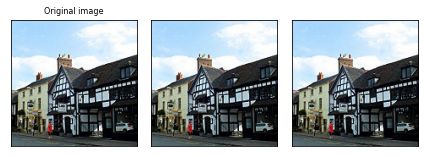

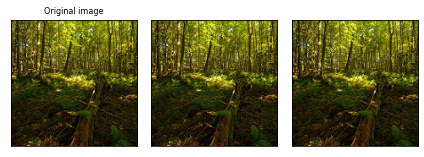

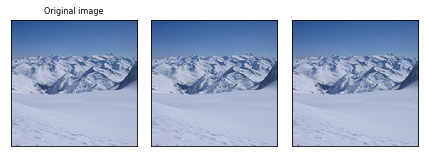

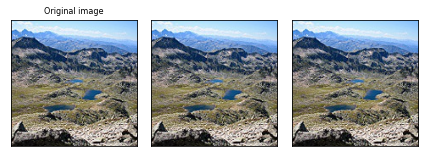

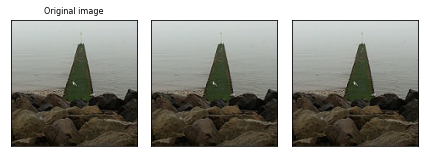

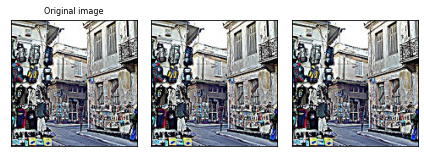

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    autocontraster = tt.RandomAutocontrast()
    autocontrasted_imgs = [autocontraster(orig_img) for _ in range(2)]
    plot(autocontrasted_imgs)

## Random Equalize

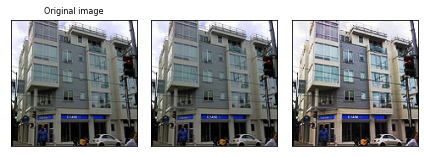

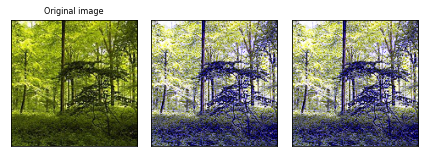

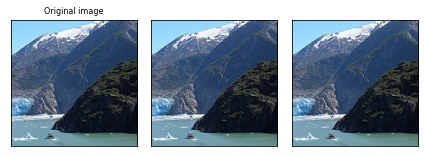

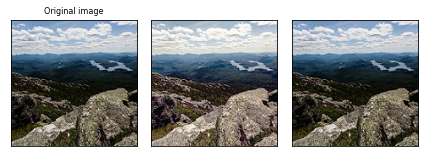

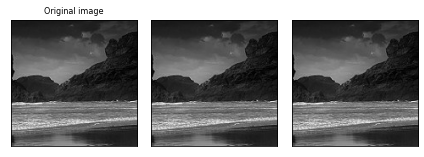

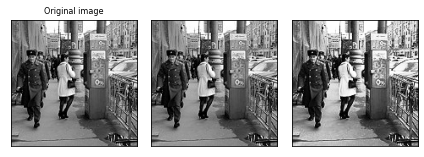

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    equalizer = tt.RandomEqualize()
    equalized_imgs = [equalizer(orig_img) for _ in range(2)]
    plot(equalized_imgs)

## Random Equalize

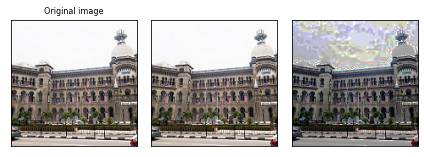

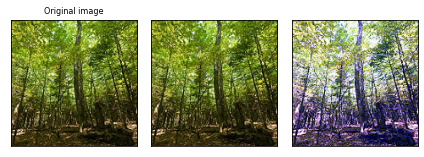

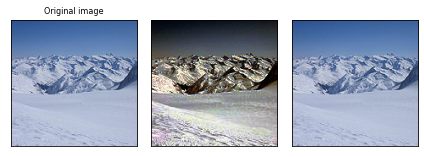

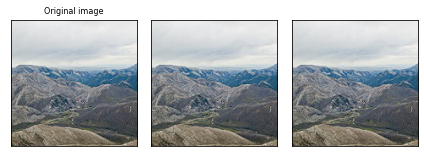

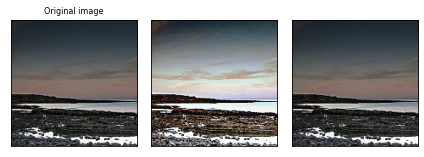

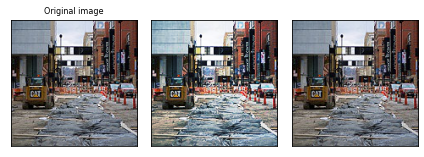

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    equalizer = tt.RandomEqualize()
    equalized_imgs = [equalizer(orig_img) for _ in range(2)]
    plot(equalized_imgs)

## Auto Augment

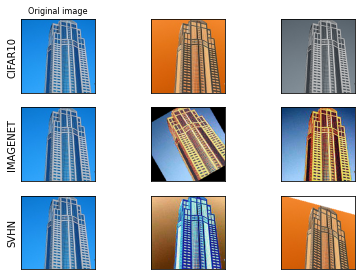

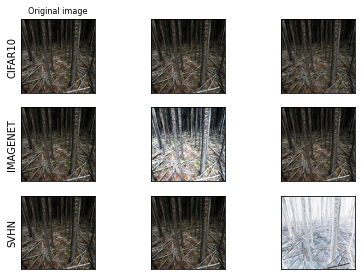

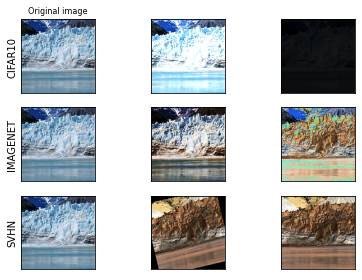

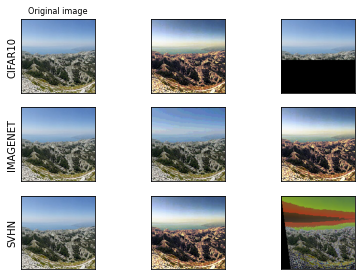

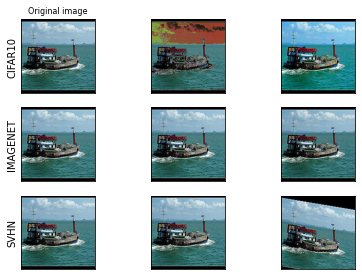

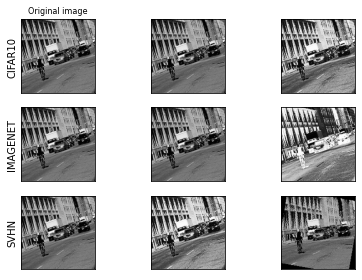

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    policies = [tt.AutoAugmentPolicy.CIFAR10, tt.AutoAugmentPolicy.IMAGENET, tt.AutoAugmentPolicy.SVHN]
    augmenters = [tt.AutoAugment(policy) for policy in policies]
    imgs = [
        [augmenter(orig_img) for _ in range(2)]
        for augmenter in augmenters
    ]
    row_title = [str(policy).split('.')[-1] for policy in policies]
    plot(imgs, row_title=row_title)

## Random Augment

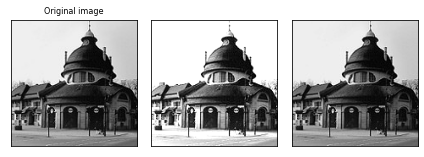

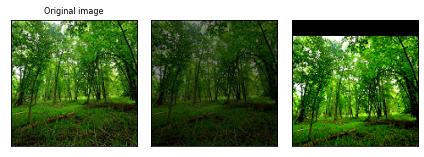

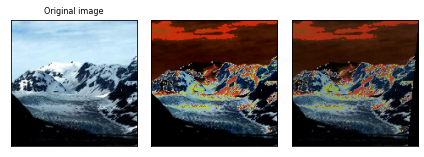

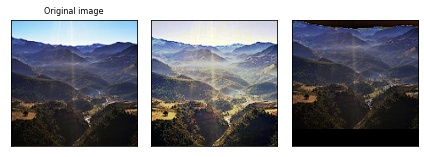

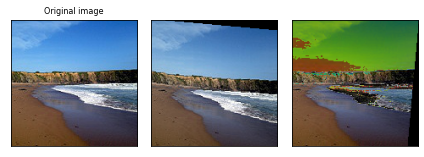

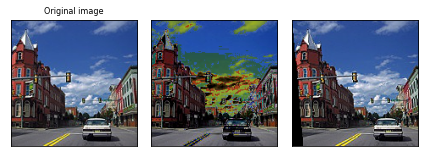

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    augmenter = tt.RandAugment()
    imgs = [augmenter(orig_img) for _ in range(2)]
    plot(imgs)

## Trivial Augment Wide

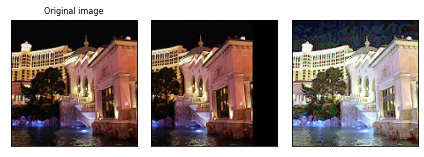

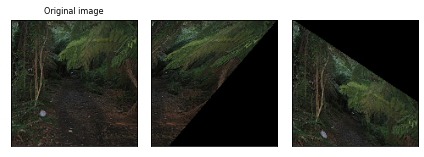

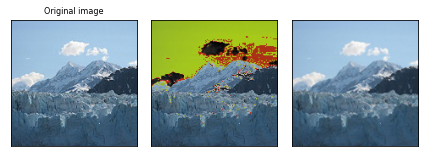

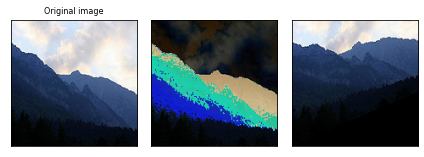

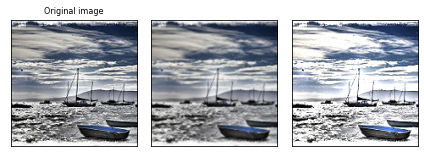

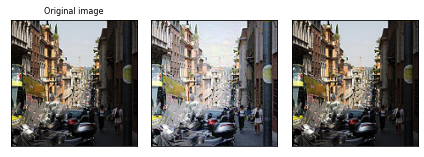

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    augmenter = tt.TrivialAugmentWide()
    imgs = [augmenter(orig_img) for _ in range(2)]
    plot(imgs)

## AugMix

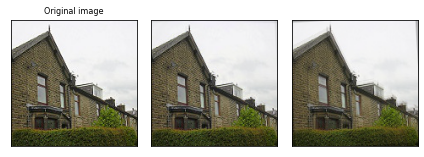

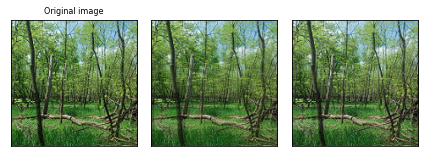

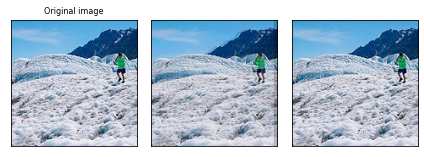

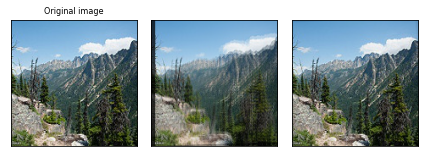

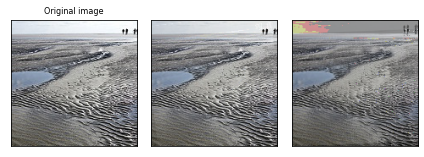

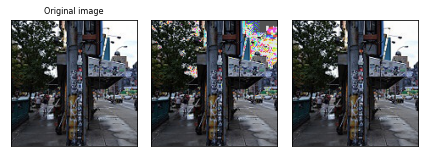

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    augmenter = tt.AugMix()
    imgs = [augmenter(orig_img) for _ in range(2)]
    plot(imgs)

## Random Horizontal Flip

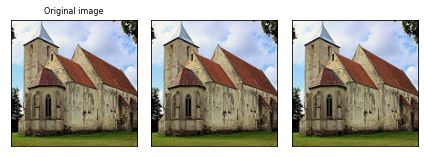

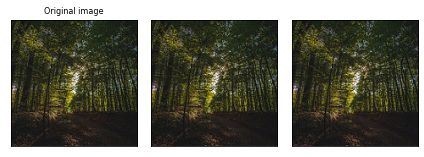

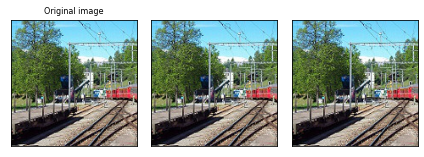

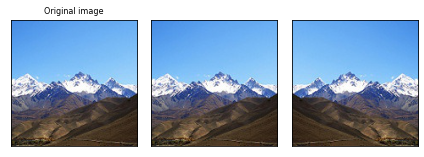

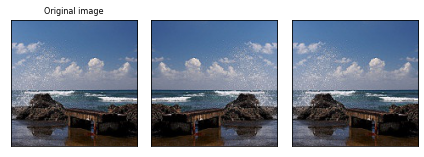

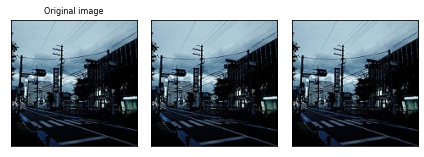

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    hflipper = tt.RandomHorizontalFlip(p=0.5)
    transformed_imgs = [hflipper(orig_img) for _ in range(2)]
    plot(transformed_imgs)

## Random Vertical Flip

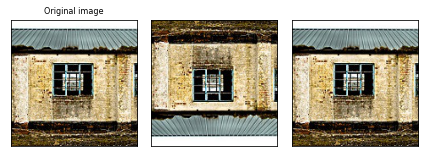

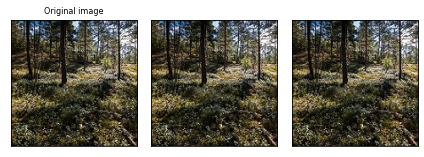

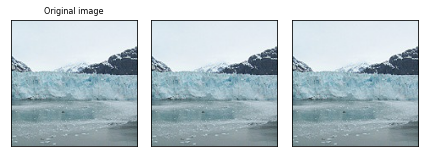

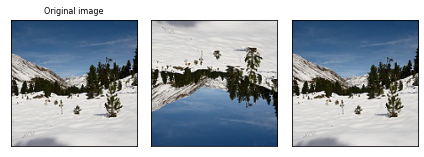

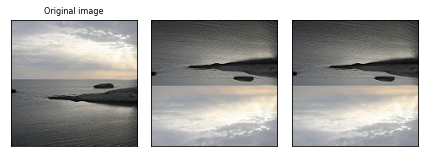

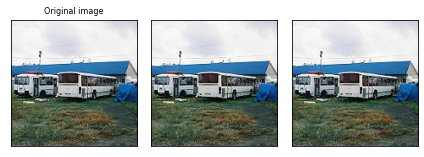

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    vflipper = tt.RandomVerticalFlip(p=0.5)
    transformed_imgs = [vflipper(orig_img) for _ in range(2)]
    plot(transformed_imgs)

## Random Apply

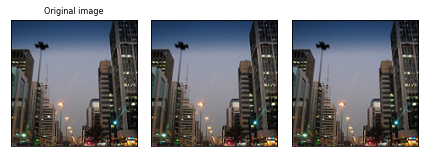

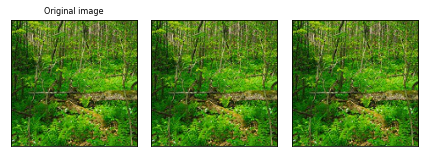

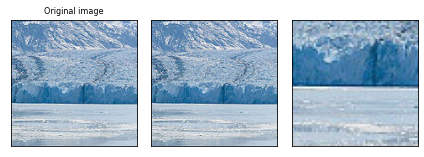

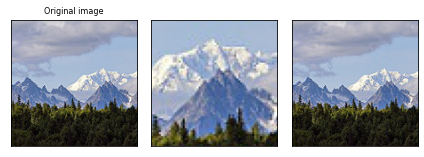

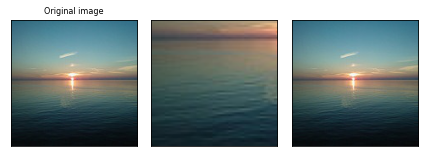

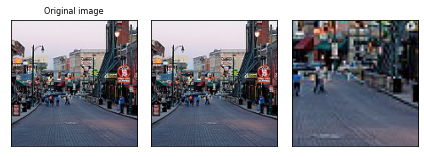

In [ ]:
for label in labels :
    files = glob.glob(base_path + label + "/*")
    index = torch.randint(low = 0, high = len(files), size = (1,))
    orig_img = Image.open(files[index])
    applier = tt.RandomApply(transforms=[tt.RandomCrop(size=(64, 64))], p=0.5)
    transformed_imgs = [applier(orig_img) for _ in range(2)]
    plot(transformed_imgs)